<a href="https://colab.research.google.com/github/rahatwads/Data-science---Cardiovascular-Disease-Risk-Prediction/blob/main/Report_002734520.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Data Cleaning, Feature Selection, Modeling and Interpretability Report

MIT License Copyright (c) 2024 rahatwads Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions: The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software. THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.


About Dataset: https://www.kaggle.com/datasets/alphiree/cardiovascular-diseases-risk-prediction-dataset

# Abstract:
This report presents a comprehensive analysis of cardiovascular disease risk prediction utilizing data science methodologies. The primary objective of this study is to develop an accurate predictive model capable of identifying individuals at risk of cardiovascular disease based on various demographic, lifestyle, and medical factors.

The analysis demonstrated promising results, with the developed predictive models showing satisfactory performance levels in identifying individuals at risk of cardiovascular disease. Through this study, valuable insights were gained into the factors influencing disease risk, highlighting the importance of data cleaning, feature selection, and model interpretability in developing accurate predictive models.

In [11]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from scipy.stats import norm
from scipy import stats
from scipy.stats import norm
from scipy import stats
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from math import sqrt
from sklearn.metrics import r2_score
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install h2o
!pip install xgboost
import h2o
from h2o.automl import H2OAutoML
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.grid.grid_search import H2OGridSearch
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns
from scipy.stats import pearsonr
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier,AdaBoostClassifier

sns.set(rc={"figure.figsize": (16, 8)})

In [2]:
from google.colab import files

# Upload kaggle.json
uploaded = files.upload()


Saving kaggle.json to kaggle.json


In [3]:
!pip install kaggle

In [4]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


In [5]:
!kaggle datasets download -d alphiree/cardiovascular-diseases-risk-prediction-dataset


  0% 0.00/4.87M [00:00<?, ?B/s]
100% 4.87M/4.87M [00:00<00:00, 78.9MB/s]


In [ ]:
!unzip cardiovascular-diseases-risk-prediction-dataset.zip


In [7]:
!pip install eli5

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 kB 3.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107720 sha256=9bc7b7cdaa312379bd12a23bf5c45387d6040032746ab36b1f4620a5ba0e0332
  Stored in directory: /root/.cache/pip/wheels/b8/58/ef/2cf4c306898c2338d51540e0922c8e0d6028e07007085c0004
Successfully built eli5


In [8]:
!ls

cardiovascular-diseases-risk-prediction-dataset.zip  kaggle.json  tree.dot
CVD_cleaned.csv					     sample_data  tree.png


# - Loading the Dataset

In [12]:
file_path = "/content/CVD_cleaned.csv"

In [13]:
df = pd.read_csv(file_path)

In [28]:
df.head()

,General_Health,Checkup,Exercise,Heart_Disease,Skin_Cancer,Other_Cancer,Depression,Diabetes,Arthritis,Sex,Age_Category,Height_(cm),Weight_(kg),BMI,Smoking_History,Alcohol_Consumption,Fruit_Consumption,Green_Vegetables_Consumption,FriedPotato_Consumption
0,Poor,Within the past 2 years,No,No,No,No,No,No,Yes,Female,70-74,150.0,32.66,14.54,Yes,0.0,30.0,16.0,12.0
1,Very Good,Within the past year,No,Yes,No,No,No,Yes,No,Female,70-74,165.0,77.11,28.29,No,0.0,30.0,0.0,4.0
2,Very Good,Within the past year,Yes,No,No,No,No,Yes,No,Female,60-64,163.0,88.45,33.47,No,4.0,12.0,3.0,16.0
3,Poor,Within the past year,Yes,Yes,No,No,No,Yes,No,Male,75-79,180.0,93.44,28.73,No,0.0,30.0,30.0,8.0
4,Good,Within the past year,No,No,No,No,No,No,No,Male,80+,191.0,88.45,24.37,Yes,0.0,8.0,4.0,0.0


# - Data Cleaning

In [29]:
df.dtypes

General_Health                   object
Checkup                          object
Exercise                         object
Heart_Disease                    object
Skin_Cancer                      object
Other_Cancer                     object
Depression                       object
Diabetes                         object
Arthritis                        object
Sex                              object
Age_Category                     object
Height_(cm)                     float64
Weight_(kg)                     float64
BMI                             float64
Smoking_History                  object
Alcohol_Consumption             float64
Fruit_Consumption               float64
Green_Vegetables_Consumption    float64
FriedPotato_Consumption         float64
dtype: object

# **Missing Values**

In [30]:
# to check missing values
missing_values = df.isnull().sum()
print(missing_values)

General_Health                  0
Checkup                         0
Exercise                        0
Heart_Disease                   0
Skin_Cancer                     0
Other_Cancer                    0
Depression                      0
Diabetes                        0
Arthritis                       0
Sex                             0
Age_Category                    0
Height_(cm)                     0
Weight_(kg)                     0
BMI                             0
Smoking_History                 0
Alcohol_Consumption             0
Fruit_Consumption               0
Green_Vegetables_Consumption    0
FriedPotato_Consumption         0
dtype: int64


- There are no missing values in this dataset.

In [14]:
#Converting in 1-0 coding for better analysis
df['Heart_Disease'] = df['Heart_Disease'].map({'No': 0, 'Yes': 1})
df['General_Health'] = df['General_Health'].map({'Poor': 1, 'Fair': 2,'Good': 3,'Very Good': 4,'Excellent': 5})
df['Exercise'] = df['Exercise'].map({'No': 0, 'Yes': 1})
df['Skin_Cancer'] = df['Skin_Cancer'].map({'No': 0, 'Yes': 1})
df['Other_Cancer'] = df['Other_Cancer'].map({'No': 0, 'Yes': 1})
df['Arthritis'] = df['Arthritis'].map({'No': 0, 'Yes': 1})
df['Sex'] = df['Sex'].map({'Male': 0, 'Female': 1})
df['Depression'] = df['Depression'].map({'No': 0, 'Yes': 1})
df['Smoking_History'] = df['Smoking_History'].map({'No': 0, 'Yes': 1})
unique_values = df['Checkup'].unique()
print(unique_values)
df['Age_Category'] = df['Age_Category'].astype("category").cat.codes
df['Checkup'] = df['Checkup'].astype("category").cat.codes
df['Diabetes'] = df['Diabetes'].astype("category").cat.codes
df.info()
#Rearraging the target variable
column_to_move = df.pop("Heart_Disease")
df.insert(18, "Heart_Disease", column_to_move)

['Within the past 2 years' 'Within the past year' '5 or more years ago'
 'Within the past 5 years' 'Never']
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 308854 entries, 0 to 308853
Data columns (total 19 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   General_Health                308854 non-null  int64  
 1   Checkup                       308854 non-null  int8   
 2   Exercise                      308854 non-null  int64  
 3   Heart_Disease                 308854 non-null  int64  
 4   Skin_Cancer                   308854 non-null  int64  
 5   Other_Cancer                  308854 non-null  int64  
 6   Depression                    308854 non-null  int64  
 7   Diabetes                      308854 non-null  int8   
 8   Arthritis                     308854 non-null  int64  
 9   Sex                           308854 non-null  int64  
 10  Age_Category                  308854 non-null  int8   
 

# Numeric Distribution

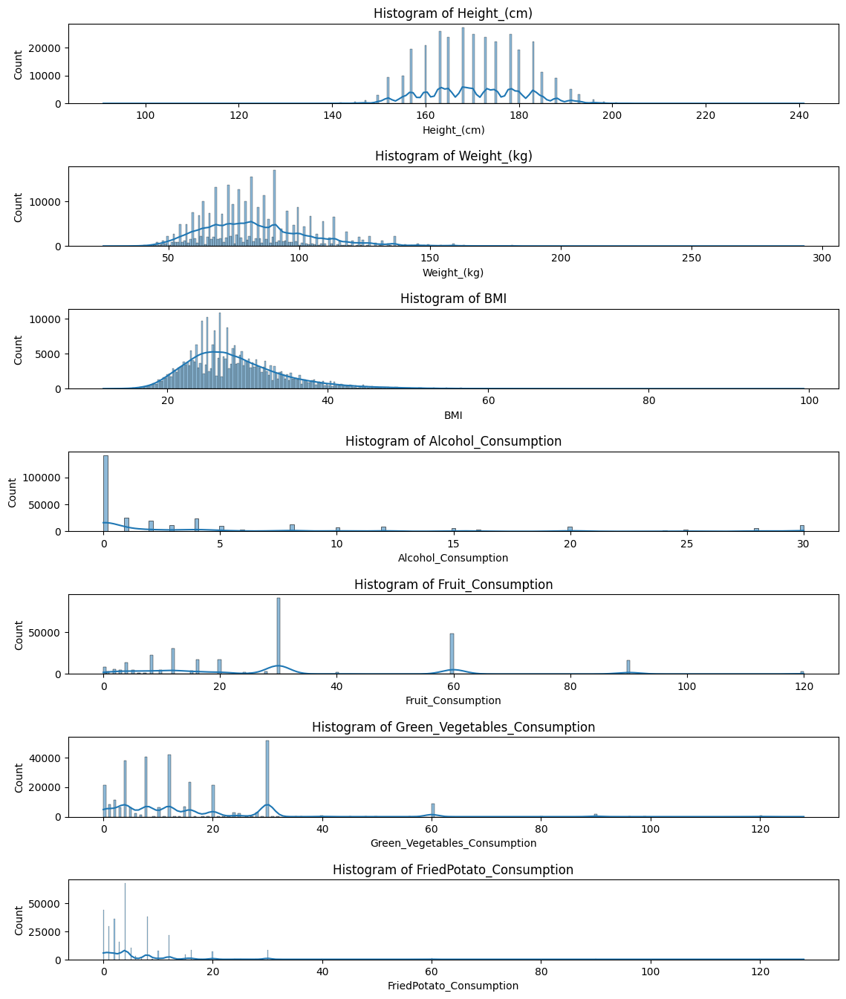

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns



# Select numeric columns
numeric_columns = df.select_dtypes(include='float64').columns


# Set up subplots
fig, axes = plt.subplots(nrows=len(numeric_columns), ncols=1, figsize=(12, 2 * len(numeric_columns)))
fig.tight_layout(pad=4.0)

# Plot histograms and kernel density plots for numeric variables
for i, col in enumerate(numeric_columns):
    sns.histplot(df[col], kde=True, ax=axes[i])
    axes[i].set_title(f'Histogram of {col}')

plt.show()



Based on the provided numeric summary statistics for the dataset, we can make some observations about the likely distributions of the numeric variables:

1. Height (cm):
The height variable appears to have a relatively normal distribution, as the mean and media are close to each other.

2. Weight (kg):
The weight variable also seems to have a relatively normal distribution. The mean and median are close.

3.BMI (Body Mass Index):
BMI is a derived variable based on height and weight. Its distribution is likely to follow a normal distribution, as the variables from which it is derived (height and weight) also exhibit normal-like distributions.

4. Alcohol Consumption:
The distribution of alcohol consumption appears to be right-skewed.

5. Fruit Consumption:
The distribution of fruit consumption seems to be right-skewed.
6. Green Vegetables Consumption:
The distribution of green vegetables consumption appears to be right-skewed.

7. Fried Potato Consumption:
The distribution of fried potato consumption also appears to be right-skewed.



# Independent variables useful to predict a target (dependent variable)

In [22]:
!pip install pandas scikit-learn

In [23]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
X = df.iloc[:,0:17]
y = df.iloc[:,-1]
y=y.astype('str')
y.head(10)
y.describe()

count     308854
unique         1
top          nan
freq      308854
Name: Heart_Disease, dtype: object

In [32]:
X = df.iloc[:,0:17]
y = df.iloc[:,-1]
y=y.astype('int')
y.head(10)
y.describe()
bestFeatures = SelectKBest(score_func= chi2, k = 17)
fit = bestFeatures.fit(X,y)
#Applying SelectKBest class to extract top features
bestFeatures = SelectKBest(score_func= chi2, k = 17)
fit = bestFeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
featureScores = pd.concat([dfcolumns,dfscores], axis = 1)
featureScores.columns = ['Specs','Score']
featureScores


,Specs,Score
0,General_Health,5029.025342
1,Checkup,636.538377
2,Exercise,644.897436
3,Skin_Cancer,2301.556881
4,Other_Cancer,2381.164106
5,Depression,261.258916
6,Diabetes,14534.216225
7,Arthritis,4922.243030
8,Sex,783.423584
9,Age_Category,30769.196487


In [33]:
print(featureScores.nlargest(10,'Score'))

                           Specs         Score
9                   Age_Category  30769.196487
6                       Diabetes  14534.216225
14           Alcohol_Consumption   5448.972562
0                 General_Health   5029.025342
7                      Arthritis   4922.243030
11                   Weight_(kg)   3542.262163
16  Green_Vegetables_Consumption   2632.505458
15             Fruit_Consumption   2576.352224
4                   Other_Cancer   2381.164106
3                    Skin_Cancer   2301.556881


# ExtraTreesClassifier for feature Importance scores

In [34]:
from sklearn.ensemble import ExtraTreesClassifier
model = ExtraTreesClassifier()
model.fit(X,y)

ExtraTreesClassifier()

In [35]:
print(model.feature_importances_)

[0.06169225 0.01879069 0.01427834 0.01192063 0.01341639 0.01545714
 0.02756111 0.01744301 0.01393601 0.09617373 0.1182507  0.13348812
 0.13803158 0.0121494  0.07798954 0.10991039 0.11951097]


# Feature Importance

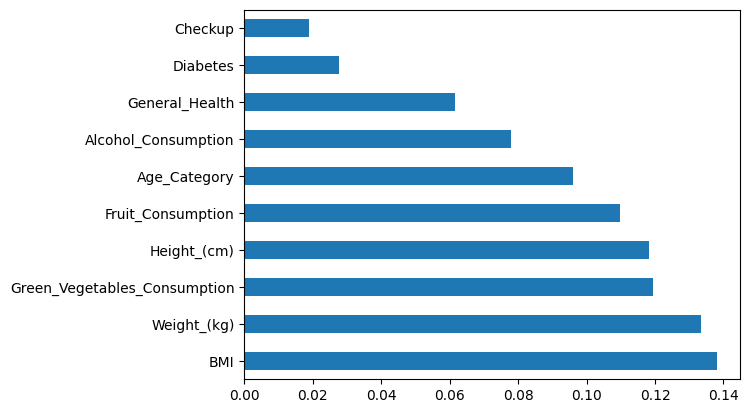

In [36]:
#Horizontal bar chart for feature importance
feat_importances = pd.Series(model.feature_importances_,index = X.columns)
feat_importances.nlargest(10).plot(kind = 'barh')
plt.show()

The pairs plot builds on two basic figures, the histogram and the scatter plot. The histogram on the diagonal allows us to see the distribution of a single variable while the scatter plots on the upper and lower triangles show the relationship between two variables
*  We see that whatever are linear are dependent variables
*   We see that BMI and height are dependent on each other obviously because BMI is calculated taking height into consideration
*  We see that BMI and weight are dependent on each other obviously because BMI is calculated taking weight into consideration
*    A lack of a clear pattern or trend in the scatterplots can indicate independence.





# Detecting outliers and removing it

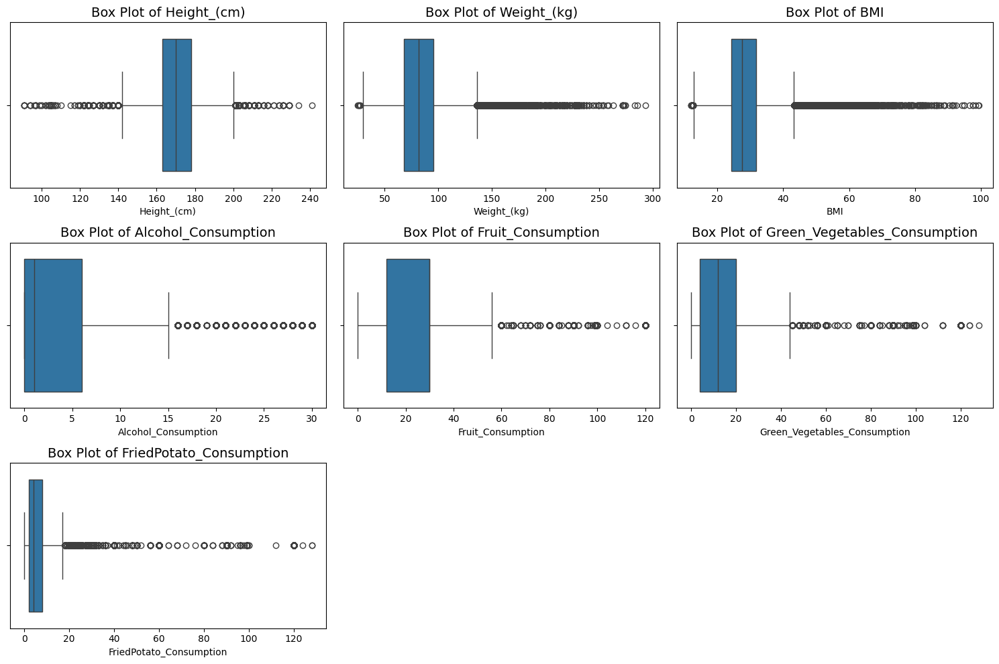

In [38]:
#First we will the if there are outliers
#box plot
numerical_columns = ['Height_(cm)', 'Weight_(kg)', 'BMI', 'Alcohol_Consumption', 'Fruit_Consumption', 'Green_Vegetables_Consumption', 'FriedPotato_Consumption']

plt.figure(figsize=(15, 10))
for i, column in enumerate(numerical_columns, 1):
    plt.subplot(3, 3, i)
    sns.boxplot(x=df[column])
    plt.title(f'Box Plot of {column}', fontsize=14)

plt.tight_layout()
plt.show()


In [17]:
import pandas as pd
# Identify and remove outliers using Z-scores
z_scores = (df - df.mean()) / df.std()
filtered_df = df[(z_scores <=3).all(axis=1)]
print("Shape of filtered dataset:", filtered_df.shape)

Shape of filtered dataset: (211931, 19)


# Accuracy and Confusion Matrix

In [18]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.preprocessing import StandardScaler

X = filtered_df.drop('Heart_Disease', axis=1)
y = filtered_df['Heart_Disease']

# Split the data into training and testing sets (70% training, 30% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Display the shapes of the training and testing sets
print("Shape of X_train:", X_train.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of y_test:", y_test.shape)

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Train a RandomForestClassifier
model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")

# Calculate and display the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

Shape of X_train: (148351, 18)
Shape of X_test: (63580, 18)
Shape of y_train: (148351,)
Shape of y_test: (63580,)
Accuracy: 1.0000
Confusion Matrix:
[[63580]]


# Classification Report

In [19]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import train_test_split

# Assuming 'X' is your feature matrix and 'y' is your target variable
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and train the Random Forest Classifier
rf_classifier = RandomForestClassifier()
rf_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = rf_classifier.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Generate confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

# Generate classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))


Accuracy: 1.0
Confusion Matrix:
[[42387]]
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     42387

    accuracy                           1.00     42387
   macro avg       1.00      1.00      1.00     42387
weighted avg       1.00      1.00      1.00     42387



- The results indicate perfect accuracy (1.0), suggesting that the model correctly classified all instances in the dataset.
- The confusion matrix shows that all predictions were correctly classified as class 0, with no false positives or false negatives.
- The classification report further confirms the high precision, recall, and F1-score for class 0, indicating excellent performance in identifying this class.
- Overall, the model achieved exceptional performance, accurately predicting the target class with no errors.

# Splitting the Data

In [41]:
import pandas as pd
from sklearn.model_selection import train_test_split

X = df.drop('Heart_Disease', axis=1)
y = df['Heart_Disease']

# Split the data into training and testing sets (70% training, 30% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

print("Shape of X_train:", X_train.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of y_test:", y_test.shape)
overlap = any(index in X_train.index for index in X_test.index)

if overlap:
    print("The training and test sets have overlapping indices.")
else:
    print("The training and test sets do not have overlapping indices.")


Shape of X_train: (216197, 18)
Shape of X_test: (92657, 18)
Shape of y_train: (216197,)
Shape of y_test: (92657,)
The training and test sets do not have overlapping indices.


In [42]:
df_X_train = pd.DataFrame(X_train)
df_X_test = pd.DataFrame(X_test)

if df_X_train.equals(df_X_test):
    print("The training and test sets have the same data.")
else:
    print("The training and test sets are different.")



The training and test sets are different.


# Heatmap For Collinearity

<Axes: >

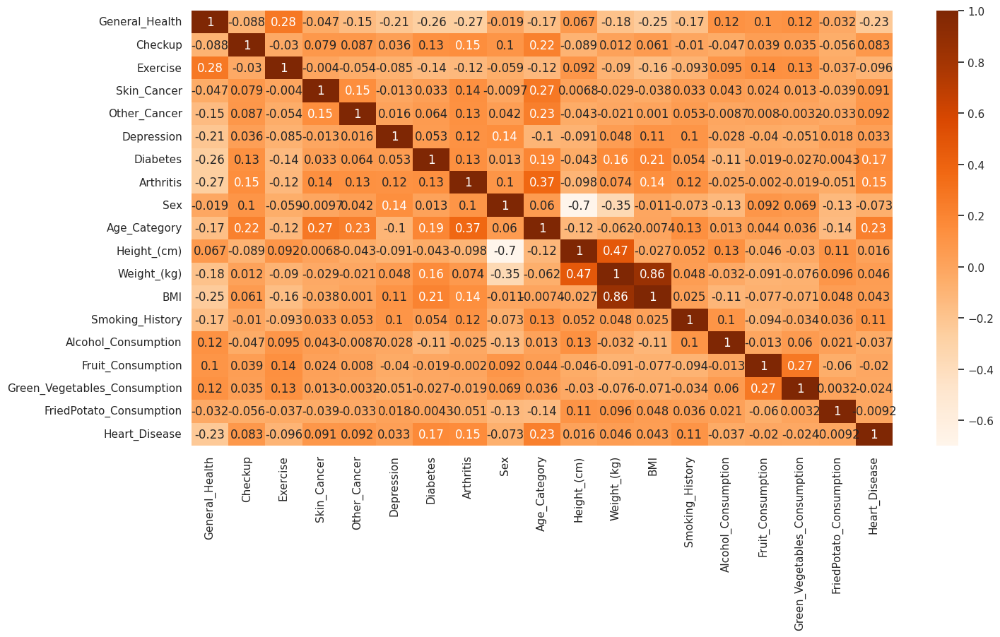

In [50]:
sns.heatmap(
   df.corr(), annot=True, cmap="Oranges"
)  # Heatmap showing correlation between the attributes.

# P- Values to find Significant Factors

In [63]:
#Using OLS for finding the p value to check the significant features
import statsmodels.api as sm

model = sm.OLS(df['Heart_Disease'], df[['General_Health', 'Checkup', 'Exercise', 'Skin_Cancer', 'Other_Cancer', 'Depression', 'Diabetes', 'Arthritis', 'Sex', 'Age_Category', 'Height_(cm)', 'Weight_(kg)', 'BMI', 'Smoking_History', 'Alcohol_Consumption', 'Fruit_Consumption', 'Green_Vegetables_Consumption', 'FriedPotato_Consumption']]).fit()

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:          Heart_Disease   R-squared (uncentered):                   0.184
Model:                            OLS   Adj. R-squared (uncentered):              0.184
Method:                 Least Squares   F-statistic:                              3859.
Date:                Mon, 01 Apr 2024   Prob (F-statistic):                        0.00
Time:                        13:52:59   Log-Likelihood:                         -18509.
No. Observations:              308854   AIC:                                  3.705e+04
Df Residuals:                  308836   BIC:                                  3.725e+04
Df Model:                          18                                                  
Covariance Type:            nonrobust                                                  
================================================================================================
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
General_Health                  -0.0419      0.001    -81.081      0.000      -0.043      -0.041
Checkup                          0.0067      0.000     14.222      0.000       0.006       0.008
Exercise                        -0.0115      0.001     -9.696      0.000      -0.014      -0.009
Skin_Cancer                      0.0247      0.002     15.069      0.000       0.021       0.028
Other_Cancer                     0.0155      0.002      9.502      0.000       0.012       0.019
Depression                       0.0110      0.001      8.970      0.000       0.009       0.013
Diabetes                         0.0310      0.001     45.429      0.000       0.030       0.032
Arthritis                        0.0213      0.001     19.209      0.000       0.019       0.023
Sex                             -0.0570      0.001    -44.693      0.000      -0.060      -0.055
Age_Category                     0.0120      0.000     76.378      0.000       0.012       0.012
Height_(cm)                      0.0010   2.25e-05     44.255      0.000       0.001       0.001
Weight_(kg)                     -0.0013   6.38e-05    -20.291      0.000      -0.001      -0.001
BMI                              0.0026      0.000     14.324      0.000       0.002       0.003
Smoking_History                  0.0242      0.001     24.636      0.000       0.022       0.026
Alcohol_Consumption             -0.0009   5.83e-05    -15.184      0.000      -0.001      -0.001
Fruit_Consumption             3.125e-05   1.96e-05      1.592      0.111   -7.23e-06    6.97e-05
Green_Vegetables_Consumption  3.088e-05   3.26e-05      0.948      0.343    -3.3e-05    9.47e-05
FriedPotato_Consumption       1.431e-05   5.51e-05      0.260      0.795   -9.37e-05       0.000
==============================================================================
Omnibus:                   155873.740   Durbin-Watson:                   1.998
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           766225.151
Skew:                           2.546   Prob(JB):                         0.00
Kurtosis:                       8.798   Cond. No.                         724.
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

# Multicollinearity

In [64]:
df1 = df[['General_Health', 'Checkup', 'Exercise', 'Skin_Cancer', 'Other_Cancer', 'Depression', 'Diabetes', 'Arthritis', 'Sex', 'Age_Category', 'Height_(cm)', 'Weight_(kg)', 'BMI', 'Smoking_History', 'Alcohol_Consumption', 'Fruit_Consumption', 'Green_Vegetables_Consumption', 'FriedPotato_Consumption']].dropna() #subset the dataframe


In [65]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
# the independent variables set
independent = df[['General_Health', 'Checkup', 'Exercise', 'Skin_Cancer', 'Other_Cancer', 'Depression', 'Diabetes', 'Arthritis', 'Sex', 'Age_Category', 'Height_(cm)', 'Weight_(kg)', 'BMI', 'Smoking_History', 'Alcohol_Consumption', 'Fruit_Consumption', 'Green_Vegetables_Consumption', 'FriedPotato_Consumption']]

# VIF dataframe
vif_data = pd.DataFrame()
vif_data["feature"] = independent.columns

# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(independent.values, i)
                          for i in range(len(independent.columns))]

print(vif_data)

                         feature         VIF
0                 General_Health   16.877411
1                        Checkup   13.907342
2                       Exercise    5.059481
3                    Skin_Cancer    1.215952
4                   Other_Cancer    1.199985
5                     Depression    1.404828
6                       Diabetes    1.353112
7                      Arthritis    1.884000
8                            Sex    3.948406
9                   Age_Category    6.407300
10                   Height_(cm)   68.993761
11                   Weight_(kg)  141.966121
12                           BMI  131.792303
13               Smoking_History    1.826657
14           Alcohol_Consumption    1.484316
15             Fruit_Consumption    2.721358
16  Green_Vegetables_Consumption    2.241009
17       FriedPotato_Consumption    1.611548


# Logistic Regression Model For Model Interpretation

In [66]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

In [67]:
# Fit a logistic regression model
lr_model = LogisticRegression()
lr_model.fit(X_train, y_train)



/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [69]:
X = df.drop(columns=['Heart_Disease'])
y = df['Heart_Disease']

# Interpret regression coefficients
coefficients = pd.DataFrame({"Feature": X.columns, "Coefficient": lr_model.coef_[0]})
print(coefficients)



                         Feature  Coefficient
0                 General_Health    -0.671535
1                        Checkup     0.158114
2                       Exercise    -0.047784
3                    Skin_Cancer     0.072420
4                   Other_Cancer     0.045244
5                     Depression     0.153651
6                       Diabetes     0.276365
7                      Arthritis     0.205328
8                            Sex    -0.405254
9                   Age_Category     0.274137
10                   Height_(cm)    -0.020083
11                   Weight_(kg)     0.018154
12                           BMI    -0.048490
13               Smoking_History     0.357495
14           Alcohol_Consumption     0.000368
15             Fruit_Consumption    -0.001010
16  Green_Vegetables_Consumption     0.002926
17       FriedPotato_Consumption    -0.003864


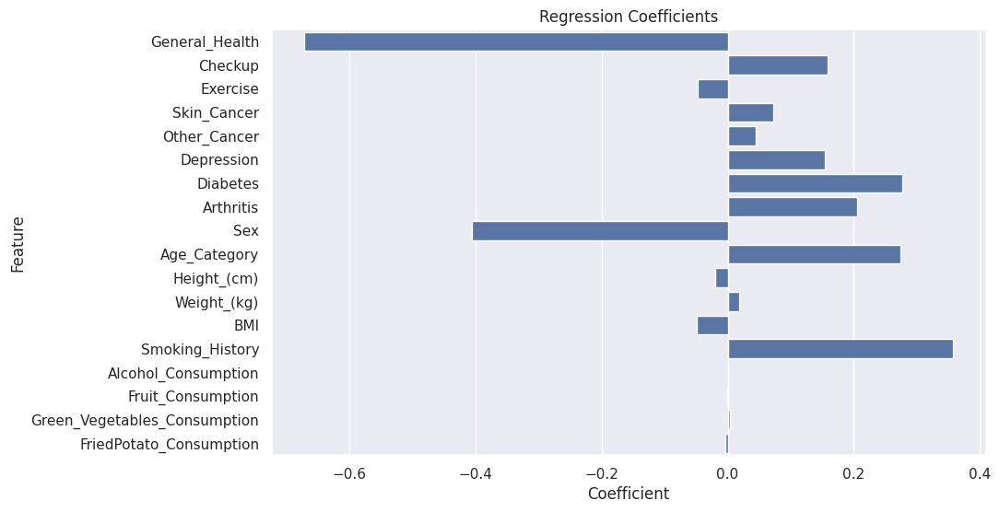

In [70]:
# Plot coefficients
plt.figure(figsize=(10, 6))
sns.barplot(x='Coefficient', y='Feature', data=coefficients)
plt.title('Regression Coefficients')
plt.xlabel('Coefficient')
plt.ylabel('Feature')
plt.show()

The barplot of regression coefficients provides insights into the impact of different features on the prediction of heart disease risk.

* Positive coefficients indicate features that positively contribute to the likelihood of heart disease, meaning an increase in these features leads to a higher risk of heart disease.
* Negative coefficients suggest features that negatively affect the likelihood of heart disease, implying that an increase in these features is associated with a lower risk of heart disease.
* The magnitude of the coefficients indicates the strength of the relationship between each feature and the outcome, with larger coefficients having a more significant impact on the prediction.
Features with coefficients close to zero have little to no effect on the prediction of heart disease risk.
* For our dataset, If we see General health  has the highest negetive coefficient that means that if the general health is bad there are more chances for a heart disease.

# Model SHAP Analysis

In [41]:
%%capture
!pip install shap
import shap

In [73]:
import shap
shap.initjs()

In [74]:
# Giving input as 1% of whole dataset as SHAP cant handle large dataset
X = X_train.sample(frac=0.01,random_state=200)
explainer = shap.LinearExplainer(lr_model, X, feature_perturbation="interventional")
shap_values = explainer.shap_values(X) #Saving SHAP values

/usr/local/lib/python3.10/dist-packages/shap/explainers/_linear.py:95: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


In [75]:
#Initialize java script
shap.initjs()

 #Explain one row in the data with the
shap.force_plot(explainer.expected_value, shap_values[0,:], X.iloc[0,:])

In [76]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, X)

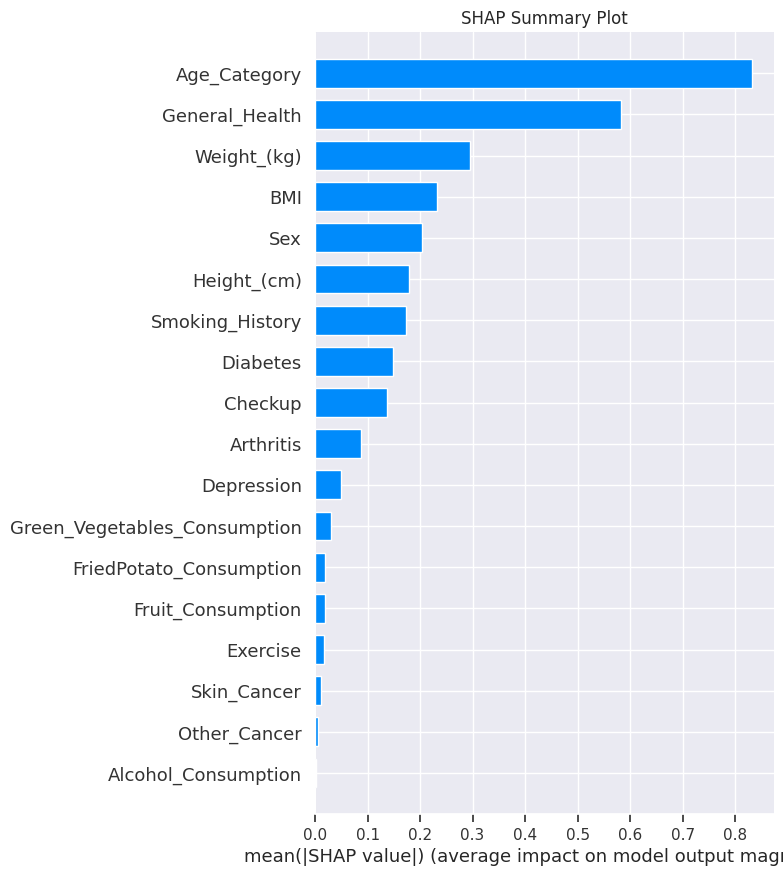

In [77]:
import shap

# Transform X_train and X_test to a format compatible with SHAP
explainer = shap.Explainer(lr_model, X_train)
shap_values = explainer.shap_values(X_test)

# Visualize SHAP summary plot
shap.summary_plot(shap_values, X_test, feature_names=X.columns, plot_type='bar', show=False)
plt.title('SHAP Summary Plot')
plt.show()


* The length of the bars in the summary plot indicates the magnitude of the
impact that each feature has on the model's output. Larger bar lengths suggest that the feature has a more significant influence on the model's predictions, while shorter bar lengths indicate a weaker influence.

* The scale of the SHAP values is aligned with the scale of the model's output. For example, if the model predicts probabilities (e.g., for binary classification), the SHAP values will be in the range of 0 to 1. If the model predicts numerical values, the SHAP values will be in the same numerical scale.





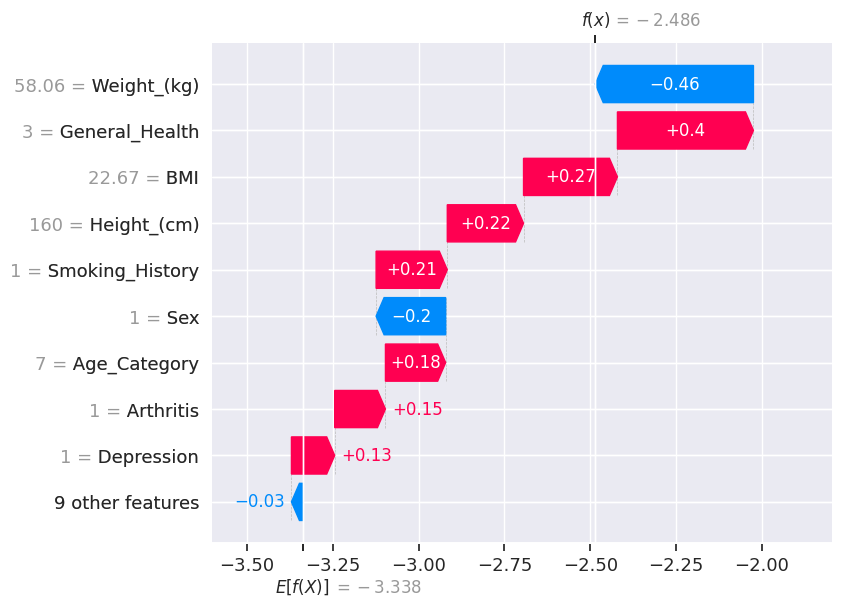

In [78]:
explainer = shap.Explainer(lr_model, X)
shap_values = explainer(X)
shap.plots.waterfall(shap_values[0])

* The plot starts with a vertical line labeled "base value," which represents the model's average prediction across all instances in the dataset.
* Each step in the plot represents the contribution of a specific feature to the prediction. The length and direction of the steps indicate the impact of each feature.
* Positive steps (to the right) indicate features that push the prediction higher, while negative steps (to the left) indicate features that push the prediction lower.
* The final vertical bar at the end of the plot shows the overall prediction for the instance, considering the contributions of all features.

# Random Forest Model for Model Interpretation

In [79]:
import random, os, sys
from sklearn.ensemble import RandomForestRegressor

def randomforest(X_train,y_train,X_test,y_test):
    rf = RandomForestRegressor()
    rf_model = rf.fit(X_train,y_train)
    print('Train set')
    pred=rf_model.predict(X_train)
    print('randomforest Mean Squared error :{}'.format(mean_squared_error(y_train,pred)))
    print('randomforest r2_score :{}'.format(r2_score(y_train,pred)))
    print('Tesst set')
    pred=rf_model.predict(X_test)
    print('randomforest Mean Squared error :{}'.format(mean_squared_error(y_test,pred)))
    print('randomforest r2_score :{}'.format(r2_score(y_test,pred)))

random_forest = RandomForestRegressor(n_estimators=100)
random_forest.fit(X_train, y_train)

RandomForestRegressor()

In [80]:
df.columns
cols1= ['General_Health', 'Checkup', 'Exercise', 'Skin_Cancer', 'Other_Cancer',
       'Depression', 'Diabetes', 'Arthritis', 'Sex', 'Age_Category',
       'Height_(cm)', 'Weight_(kg)', 'BMI', 'Smoking_History',
       'Alcohol_Consumption', 'Fruit_Consumption',
       'Green_Vegetables_Consumption', 'FriedPotato_Consumption']

In [81]:
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
randomforest(X_train[cols1],y_train,X_test[cols1],y_test)

Train set
randomforest Mean Squared error :0.009541966723379347
randomforest r2_score :0.8711641611175481
Tesst set
randomforest Mean Squared error :0.06893831137031081
randomforest r2_score :0.07957056654362604


# Model SHAP Analysis

In [82]:
X = X_train.head(10)
 # Using Tree explainer as this is tree based classifier model
explainer = shap.TreeExplainer(random_forest)
shap_values = explainer.shap_values(X)
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[0,:], X.iloc[0,:])

* SHAP values above the base value would indicate factors that increase the probability of approval, while values below the base value would indicate factors that decrease the probability.

In [83]:
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, X)

* The force plot visualizes how each feature affects the model's prediction for each category or instance.
* Each horizontal bar in the plot represents a feature, and the length and direction of the bar show the magnitude and direction of its impact on the prediction.
* Positive values push the prediction higher, while negative values push it lower.

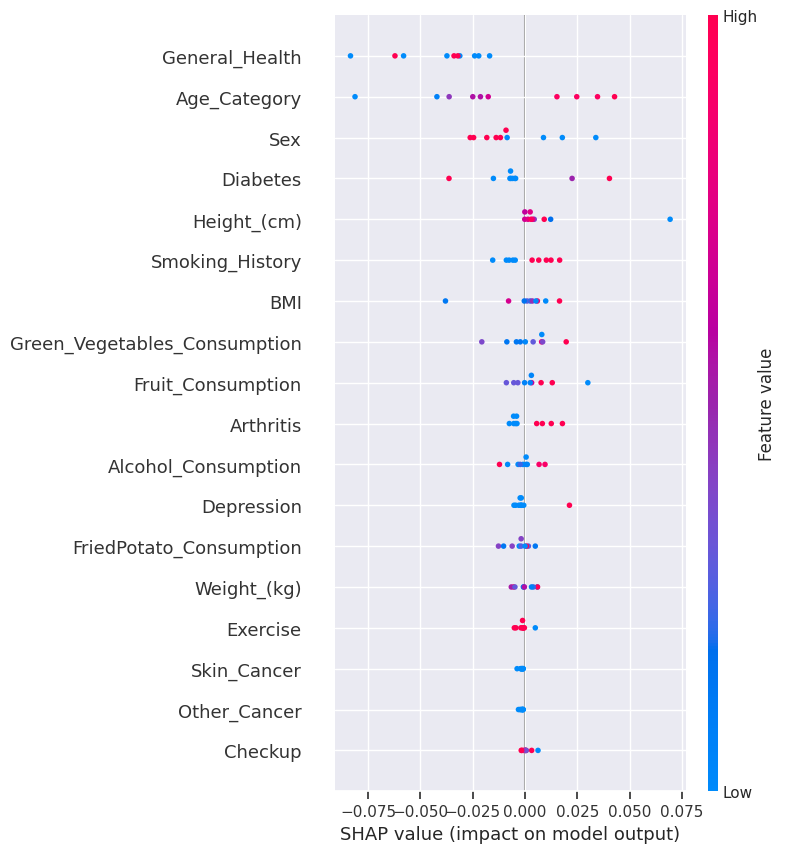

In [84]:
shap.initjs()
shap.summary_plot(shap_values, X)

* The summary plot visualizes the overall impact of each feature on the model's predictions across the entire dataset.
* Each feature is represented by a vertical bar, where the length of the bar corresponds to the magnitude of its impact on the model's output.

* Features are sorted by their importance, with the most influential features appearing at the top.
* The color of each bar indicates the direction of the feature's effect: red bars indicate features that push the prediction higher, while blue bars indicate features that push the prediction lower.
* The plot also includes a feature importance plot at the bottom, which ranks the features based on their importance in the model's predictions.

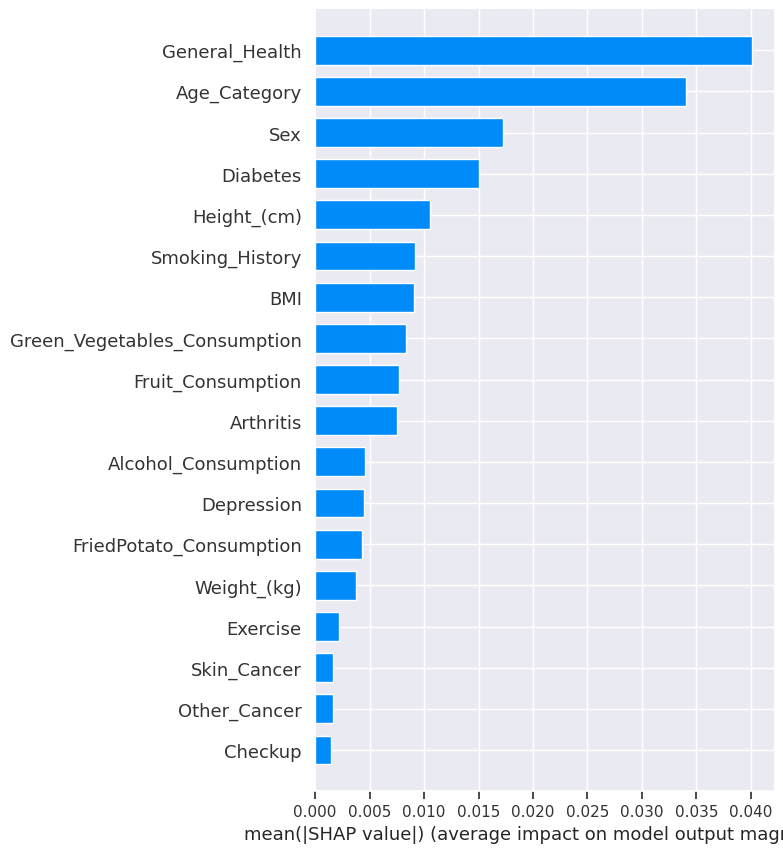

In [85]:
shap.summary_plot(shap_values, X, plot_type="bar")

In [86]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import load_iris
iris = load_iris()

model_rf1 = RandomForestRegressor(n_estimators=10)
# Train
model_rf1.fit(iris.data, iris.target)
# Extract single tree
estimator = model_rf1.estimators_[5]

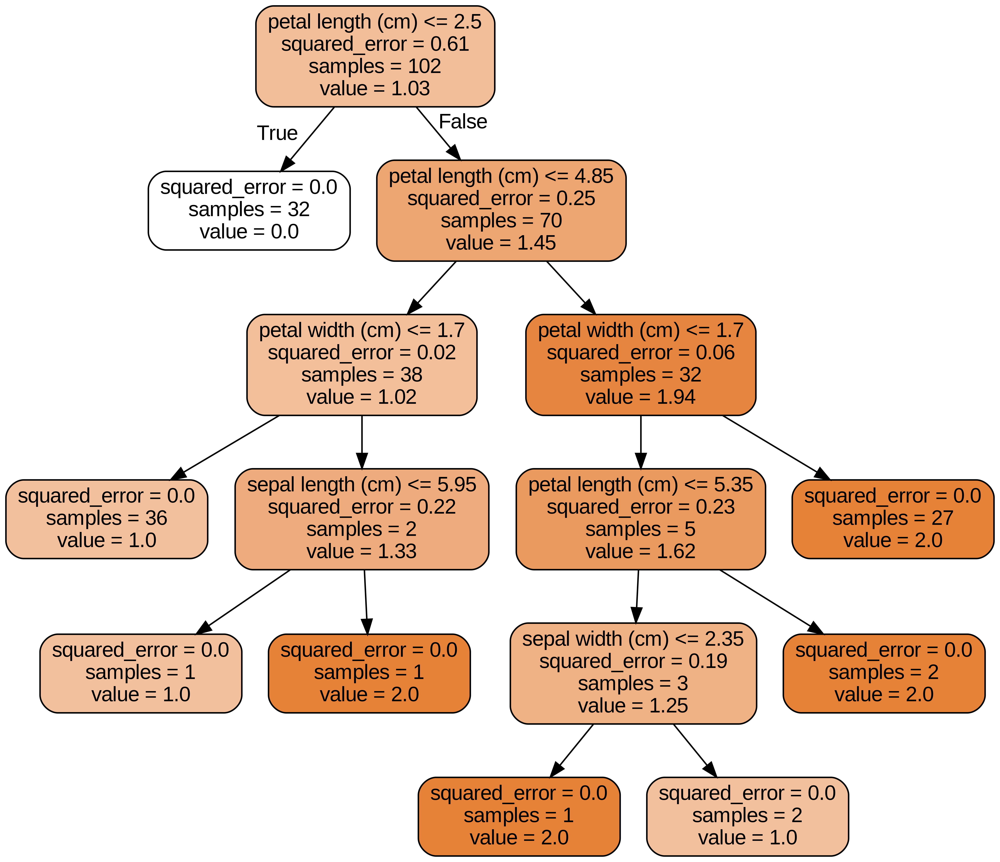

In [87]:
from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot',
                feature_names = iris.feature_names,
                class_names = iris.target_names,
                rounded = True, proportion = False,
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in colab notebook
from IPython.display import Image
Image(filename = 'tree.png')

# **Tree-Based Model Interpretation:**
* We can infer that "age category" is the most influential feature in the Random Forest model, while "checkup" is the least influential. This means that the model relies heavily on age categories to make predictions, whereas regular checkup frequency has less impact on its decisions.

In [31]:
# Setting up maximum runtime for the AutoML
min_mem_size = 6
run_time = 222

In [32]:
pct_memory = 0.5
virtual_memory = psutil.virtual_memory()
min_mem_size = int(round(int(pct_memory * virtual_memory.available) / 1073741824, 0))
print(min_mem_size)

4


# Auto ML for Best Model
- Regression

In [22]:
from sklearn.model_selection import  train_test_split
X = df[['Diabetes', 'Checkup', 'Exercise', 'Heart_Disease',
       'Skin_Cancer', 'Other_Cancer', 'Depression', 'Arthritis', 'Sex', 'Age_Category', 'Height_(cm)', 'Weight_(kg)','General_Health','Smoking_History','Alcohol_Consumption','Fruit_Consumption','Green_Vegetables_Consumption','FriedPotato_Consumption']]

y = df['BMI']

#Spliting data into Training 70%, Test set 30%

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

In [23]:
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet, SGDRegressor
ridge = Ridge(fit_intercept=True, alpha=0.5)
ridge.fit(X_train, y_train)

Ridge(alpha=0.5)

In [24]:
from sklearn import metrics
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, f1_score, precision_score, recall_score, roc_auc_score, roc_curve
# rmse after regularization
y_pred = ridge.predict(X_test)

rmse = np.sqrt(metrics.mean_squared_error(y_test, y_pred))
rmse

0.8903282131820097

In [26]:
import random
import logging
import sys
import h2o
min_mem_size = 4
logs_path = "/tmp/"
logfile = "h2o_logs.log"


# Start the H2O server on a random port
port_no = random.randint(5555, 55555)

try:
    h2o.init(
        strict_version_check=False, min_mem_size_GB=min_mem_size, port=port_no
    )  # start h2o
except:
    logging.critical("h2o.init")
    h2o.download_all_logs(dirname=logs_path, filename=logfile)
    h2o.cluster().shutdown()
    sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:24737..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.22" 2024-01-16; OpenJDK Runtime Environment (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1); OpenJDK 64-Bit Server VM (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmphpuvm2xg
  JVM stdout: /tmp/tmphpuvm2xg/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmphpuvm2xg/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:24737
Connecting to H2O server at http://127.0.0.1:24737 ... successful.


H2O_cluster_uptime:,05 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.1
H2O_cluster_version_age:,19 days
H2O_cluster_name:,H2O_from_python_unknownUser_71vr9m
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,4 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [27]:
h2o_df = h2o.H2OFrame(
   df)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [28]:
pct_rows = 0.80  # Setting up the data split between training and test dataset.
df_train, df_test = h2o_df.split_frame([pct_rows])

In [29]:
# Set the features and target
X=h2o_df.columns
print(X)
y ='Heart_Disease'
X.remove(y)
print(X)

['General_Health', 'Checkup', 'Exercise', 'Skin_Cancer', 'Other_Cancer', 'Depression', 'Diabetes', 'Arthritis', 'Sex', 'Age_Category', 'Height_(cm)', 'Weight_(kg)', 'BMI', 'Smoking_History', 'Alcohol_Consumption', 'Fruit_Consumption', 'Green_Vegetables_Consumption', 'FriedPotato_Consumption', 'Heart_Disease']
['General_Health', 'Checkup', 'Exercise', 'Skin_Cancer', 'Other_Cancer', 'Depression', 'Diabetes', 'Arthritis', 'Sex', 'Age_Category', 'Height_(cm)', 'Weight_(kg)', 'BMI', 'Smoking_History', 'Alcohol_Consumption', 'Fruit_Consumption', 'Green_Vegetables_Consumption', 'FriedPotato_Consumption']


In [33]:
aml = H2OAutoML(max_runtime_secs=run_time, seed=1)

In [34]:
aml.train(x=X, y=y, training_frame=df_train)

AutoML progress: |
18:47:05.183: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

█████████████████
18:48:02.742: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

█
18:48:08.98: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

█████████
18:48:41.320: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

███
18:48:50.270: _r

key,value
Stacking strategy,blending
Number of base models (used / total),6/12
# GBM base models (used / total),3/5
# XGBoost base models (used / total),1/3
# DeepLearning base models (used / total),1/1
# GLM base models (used / total),0/1
# DRF base models (used / total),1/2
Metalearner algorithm,GLM
Metalearner fold assignment scheme,AUTO
Metalearner nfolds,0


In [35]:
print(aml.leaderboard)

model_id                                                     rmse        mse       mae     rmsle    mean_residual_deviance
StackedEnsemble_AllModels_2_AutoML_1_20240401_184703     0.253864  0.0644471  0.128707  0.177735                 0.0644471
StackedEnsemble_AllModels_1_AutoML_1_20240401_184703     0.253943  0.0644873  0.129462  0.177727                 0.0644873
StackedEnsemble_BestOfFamily_3_AutoML_1_20240401_184703  0.253968  0.0644996  0.128912  0.177772                 0.0644996
StackedEnsemble_BestOfFamily_2_AutoML_1_20240401_184703  0.254067  0.06455    0.129951  0.177754                 0.06455
GBM_2_AutoML_1_20240401_184703                           0.254118  0.064576   0.128809  0.177988                 0.064576
GBM_3_AutoML_1_20240401_184703                           0.254203  0.064619   0.128729  0.178211                 0.064619
StackedEnsemble_BestOfFamily_1_AutoML_1_20240401_184703  0.254575  0.0648086  0.132856  0.178364                 0.0648086
XGBoost_3_AutoML_1_2

In [36]:
lb = aml.leaderboard
lb.head(rows=lb.nrows)

model_id,rmse,mse,mae,rmsle,mean_residual_deviance
StackedEnsemble_AllModels_2_AutoML_1_20240401_184703,0.253864,0.0644471,0.128707,0.177735,0.0644471
StackedEnsemble_AllModels_1_AutoML_1_20240401_184703,0.253943,0.0644873,0.129462,0.177727,0.0644873
StackedEnsemble_BestOfFamily_3_AutoML_1_20240401_184703,0.253968,0.0644996,0.128912,0.177772,0.0644996
StackedEnsemble_BestOfFamily_2_AutoML_1_20240401_184703,0.254067,0.06455,0.129951,0.177754,0.06455
GBM_2_AutoML_1_20240401_184703,0.254118,0.064576,0.128809,0.177988,0.064576
GBM_3_AutoML_1_20240401_184703,0.254203,0.064619,0.128729,0.178211,0.064619
StackedEnsemble_BestOfFamily_1_AutoML_1_20240401_184703,0.254575,0.0648086,0.132856,0.178364,0.0648086
XGBoost_3_AutoML_1_20240401_184703,0.254854,0.0649506,0.144461,0.17984,0.0649506
GBM_1_AutoML_1_20240401_184703,0.254909,0.0649785,0.129243,0.178964,0.0649785
GBM_4_AutoML_1_20240401_184703,0.255557,0.0653092,0.128933,0.179325,0.0653092


In [37]:
model_index = 0
glm_index = 0
glm_model = ""
aml_leaderboard_df = aml.leaderboard.as_data_frame()
models_dict = {}
for m in aml_leaderboard_df["model_id"]:
    models_dict[m] = model_index
    if "StackedEnsemble" not in m:
        break
    model_index = model_index + 1

for m in aml_leaderboard_df["model_id"]:
    if "GLM" in m:
        models_dict[m] = glm_index
        break
    glm_index = glm_index + 1
models_dict

/usr/local/lib/python3.10/dist-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


{'StackedEnsemble_AllModels_2_AutoML_1_20240401_184703': 0,
 'StackedEnsemble_AllModels_1_AutoML_1_20240401_184703': 1,
 'StackedEnsemble_BestOfFamily_3_AutoML_1_20240401_184703': 2,
 'StackedEnsemble_BestOfFamily_2_AutoML_1_20240401_184703': 3,
 'GBM_2_AutoML_1_20240401_184703': 4,
 'GLM_1_AutoML_1_20240401_184703': 12}

In [38]:
print(model_index)
best_model = h2o.get_model(aml.leaderboard[model_index, "model_id"])

4


In [39]:
#Printing the best model
print("The best model is - " , best_model.algo)

The best model is -  gbm


In [99]:
import matplotlib.pyplot as plt

%matplotlib inline

import warnings
import matplotlib.cbook

warnings.filterwarnings("ignore", category=matplotlib.cbook.mplDeprecation)

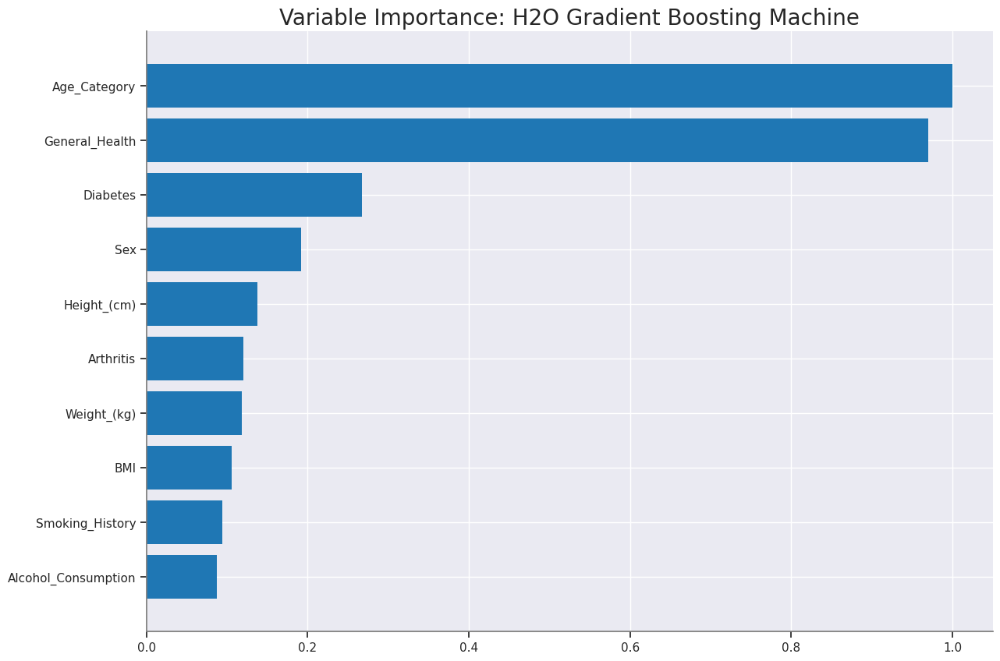

<Figure size 1600x800 with 0 Axes>

In [100]:
if best_model.algo in [
    "gbm",
    "drf",
    "xrt",
    "xgboost",
]:  # Importance of all the variables in GBM algorithm.
    best_model.varimp_plot()

<>:1: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<>:1: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<ipython-input-101-0cab54a0793b>:1: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if glm_index is not 0:


7
glm


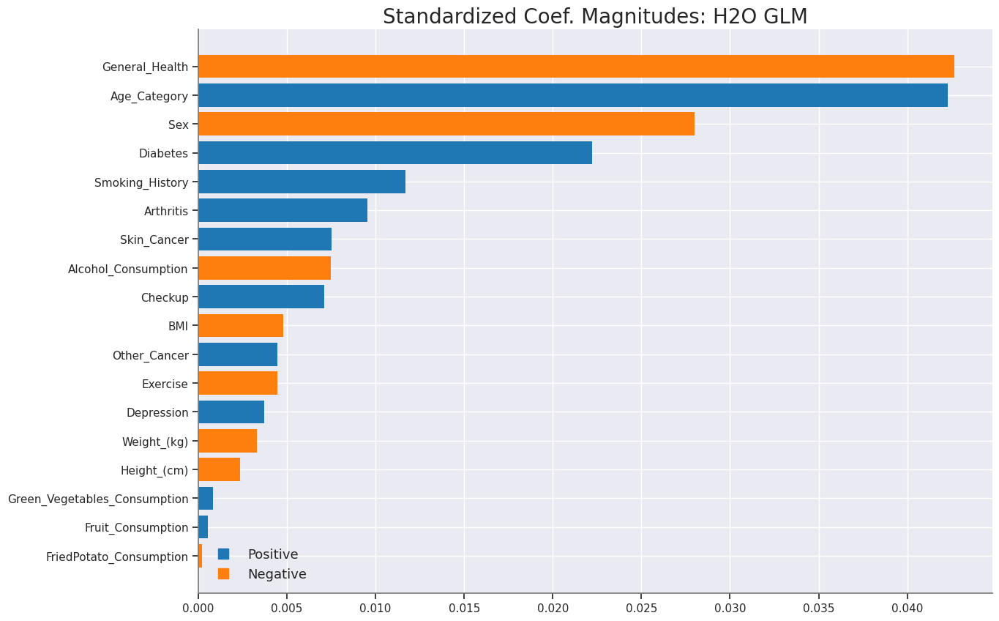

In [101]:
if glm_index is not 0:
    print(glm_index)
    glm_model = h2o.get_model(aml.leaderboard[glm_index, "model_id"])
    print(glm_model.algo)
    glm_model.std_coef_plot()

# Model SHAP Analysis

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_AllModels_1_AutoML_1_20240401_141142,0.251377,0.0631904,0.128653,0.176369,0.0631904,7306,0.038413,StackedEnsemble
GBM_2_AutoML_1_20240401_141142,0.251571,0.0632881,0.129487,0.175623,0.0632881,13422,0.009066,GBM
StackedEnsemble_BestOfFamily_2_AutoML_1_20240401_141142,0.251696,0.063351,0.130095,0.176668,0.063351,3061,0.02191,StackedEnsemble
GBM_3_AutoML_1_20240401_141142,0.251847,0.0634268,0.129802,0.175889,0.0634268,12913,0.009617,GBM
StackedEnsemble_BestOfFamily_1_AutoML_1_20240401_141142,0.252113,0.0635609,0.133176,0.177053,0.0635609,7497,0.034204,StackedEnsemble
GBM_1_AutoML_1_20240401_141142,0.25262,0.0638167,0.128251,0.177498,0.0638167,40648,0.025349,GBM
GBM_4_AutoML_1_20240401_141142,0.252769,0.0638922,0.129406,0.177017,0.0638922,12531,0.012482,GBM
GLM_1_AutoML_1_20240401_141142,0.255552,0.065307,0.14711,0.18003,0.065307,10483,0.000517,GLM
XGBoost_2_AutoML_1_20240401_141142,0.256696,0.0658926,0.132409,0.181309,0.0658926,14391,0.003334,XGBoost
XGBoost_1_AutoML_1_20240401_141142,0.268238,0.0719515,0.141577,0.192958,0.0719515,73082,0.01135,XGBoost


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

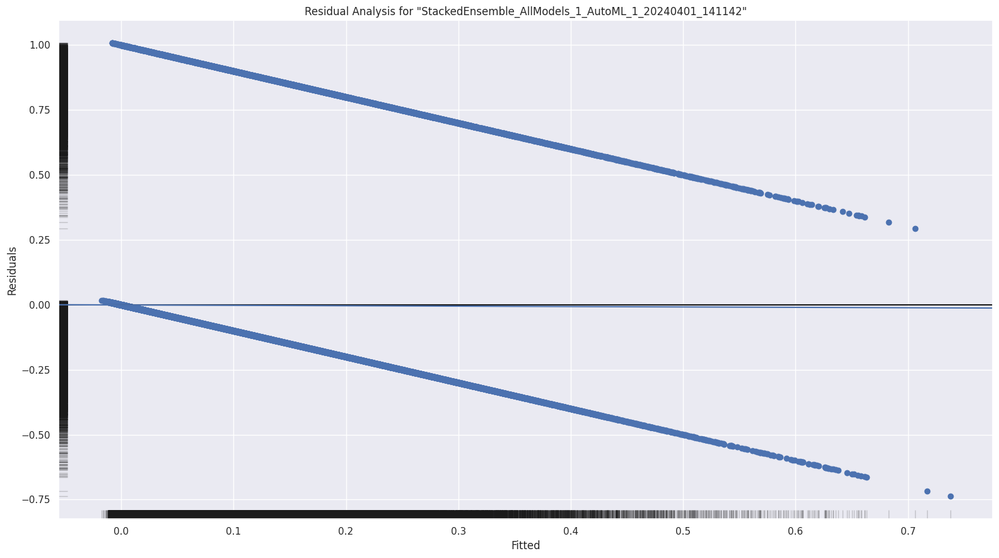

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

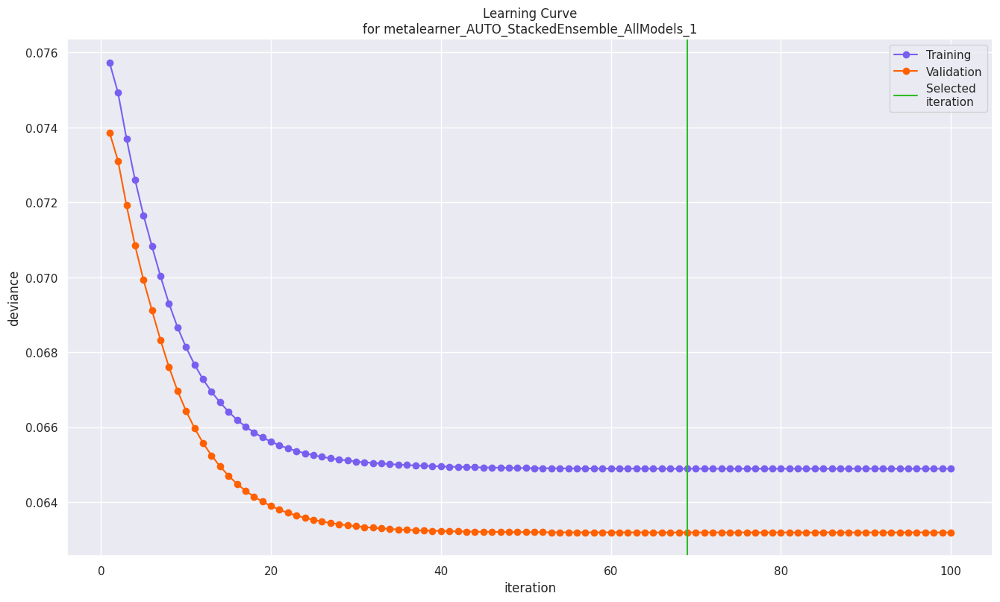

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

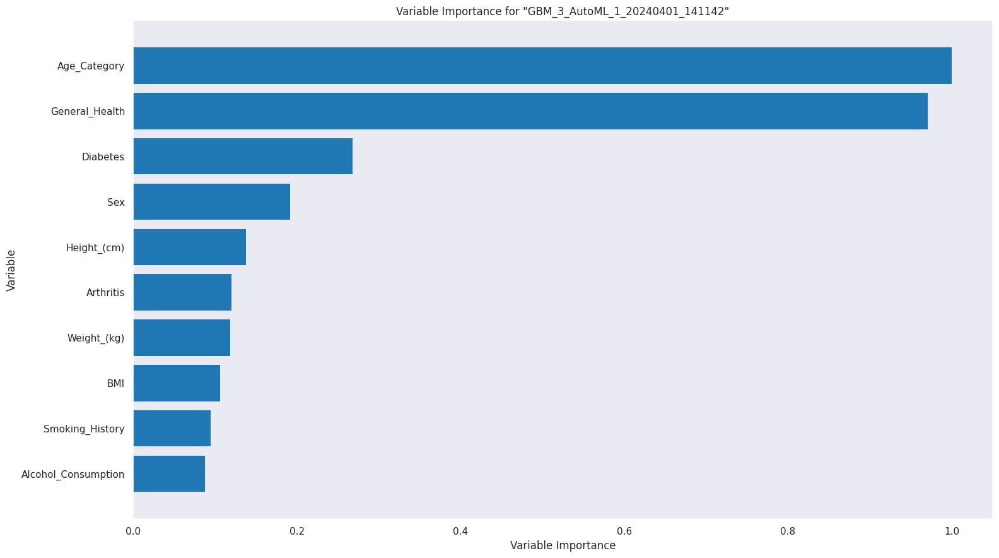

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

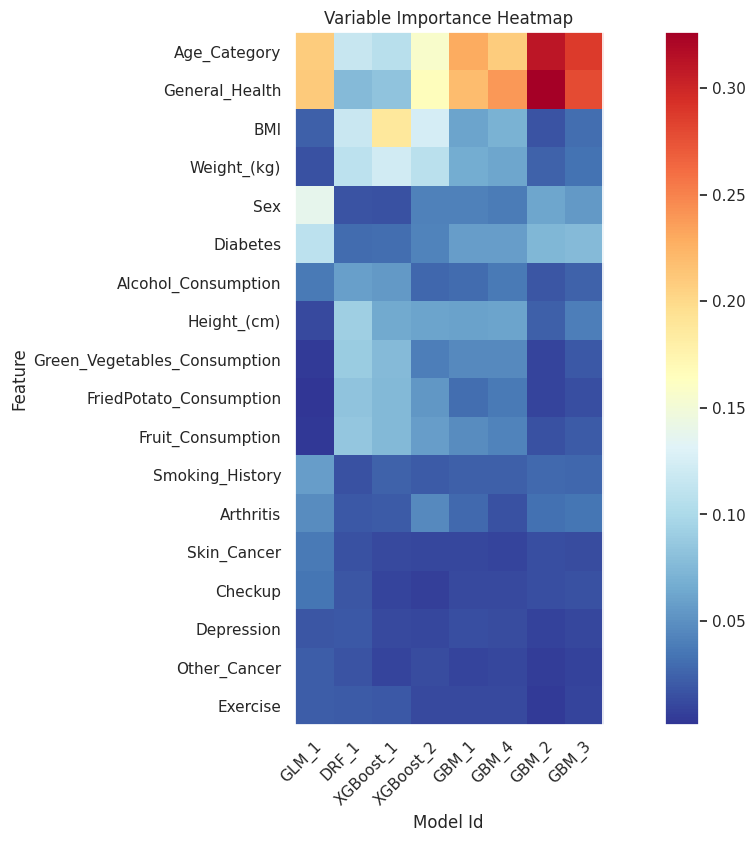

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

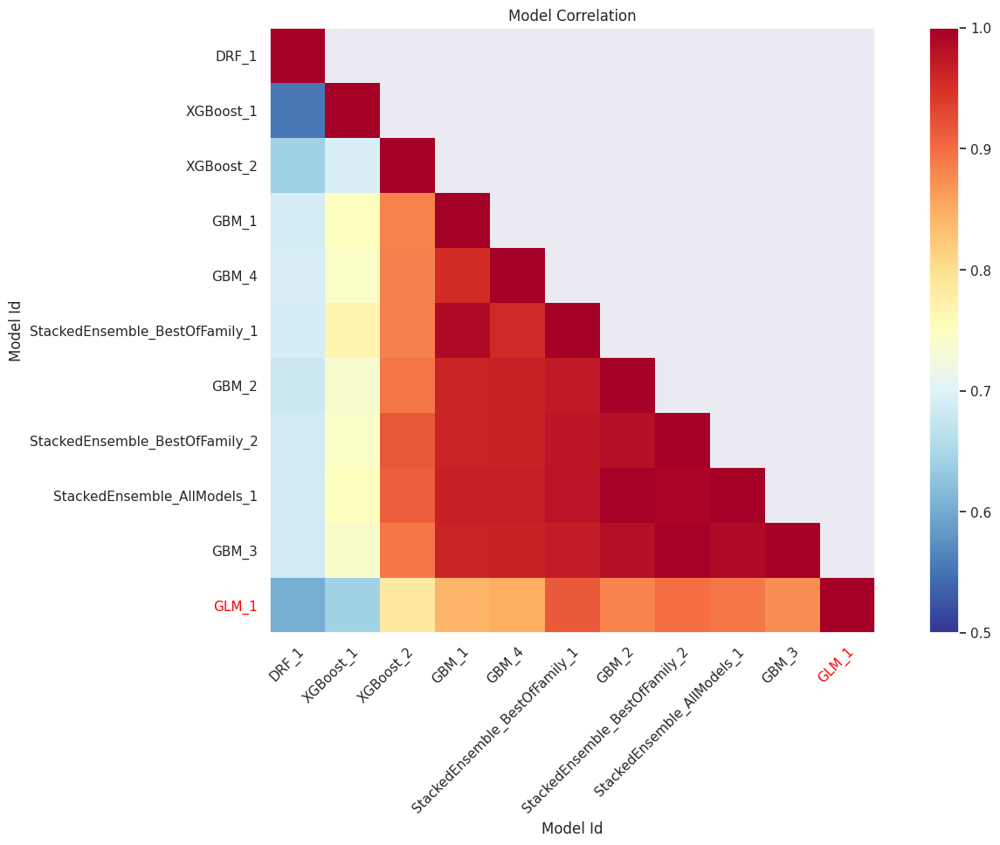

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

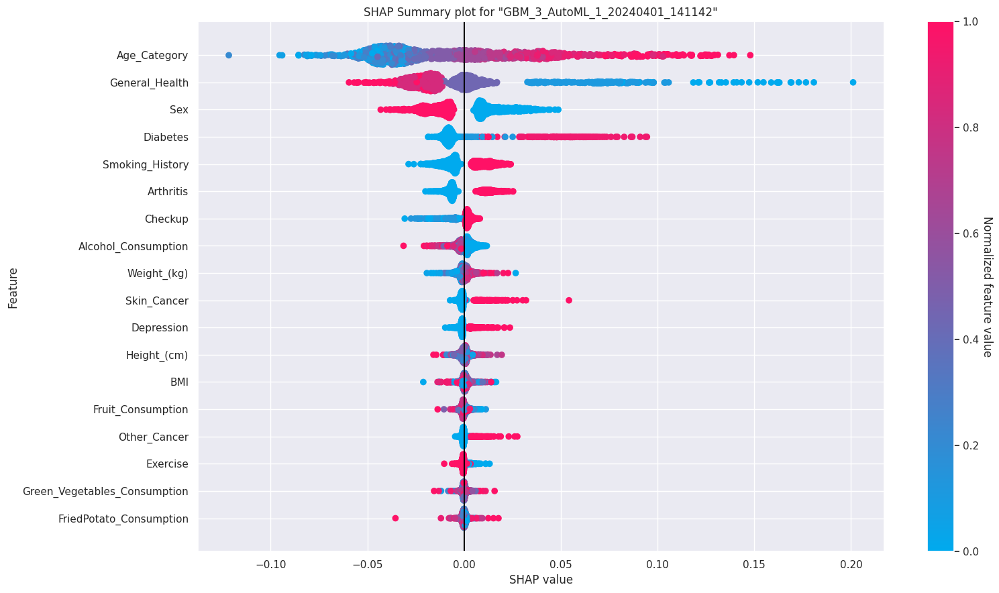

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

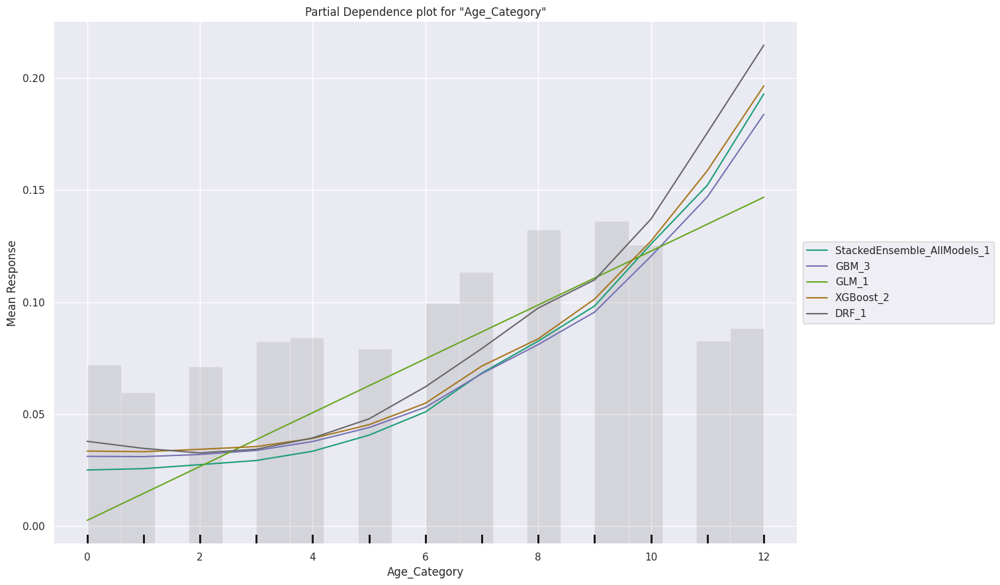

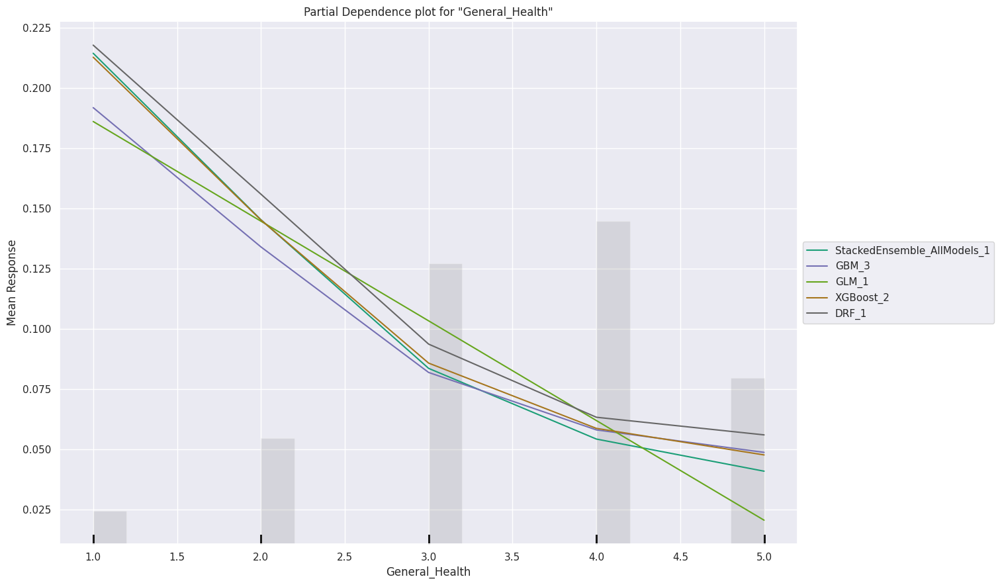

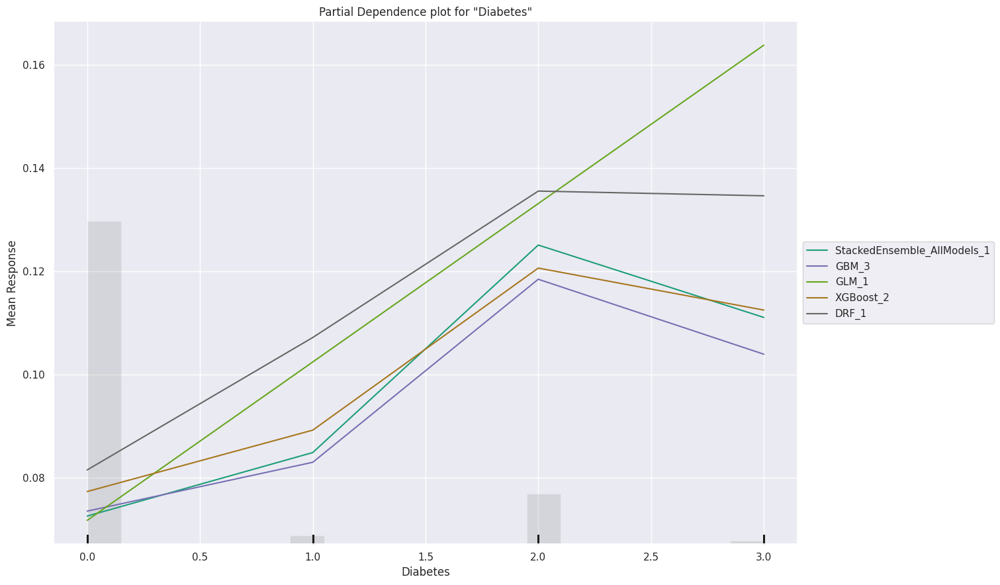

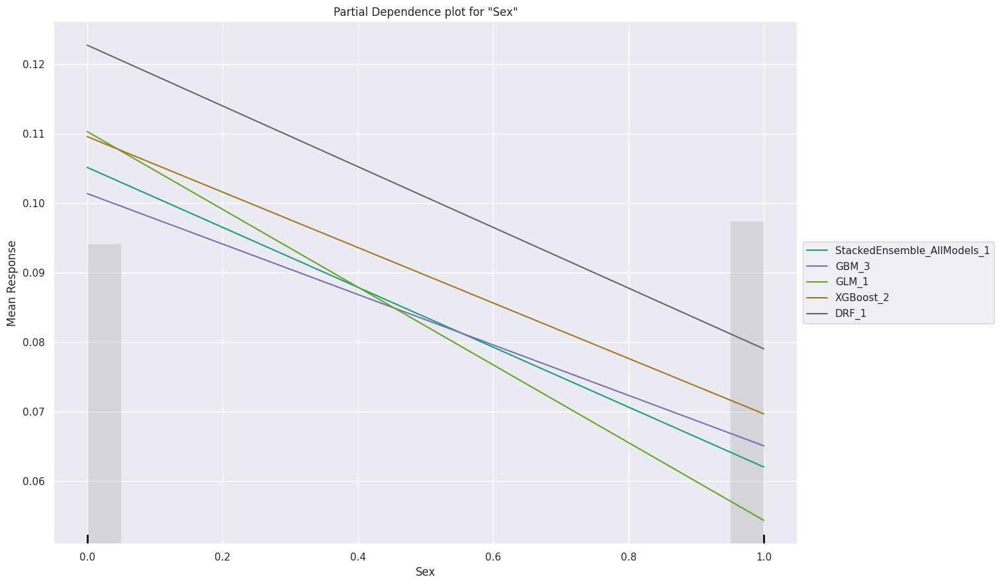

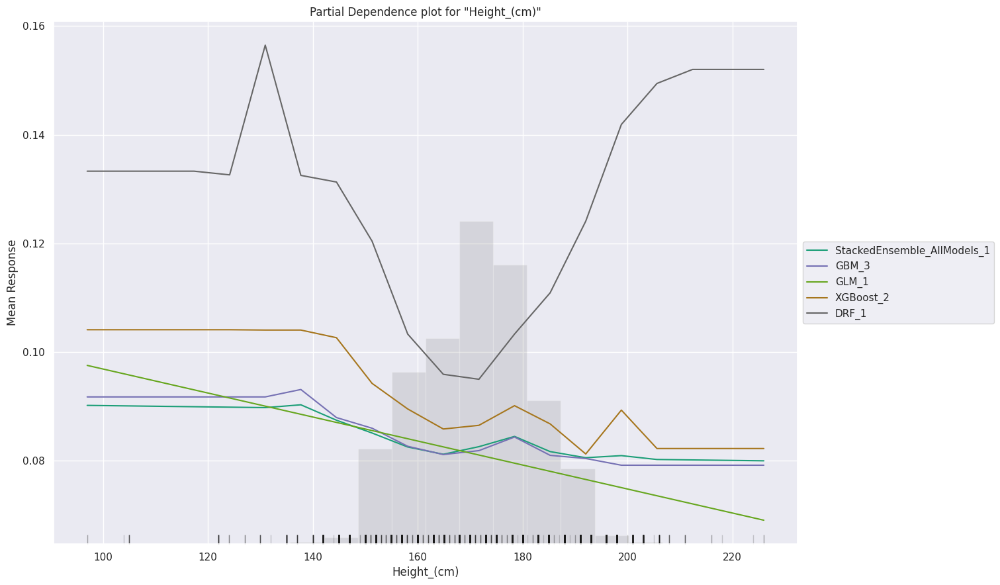

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

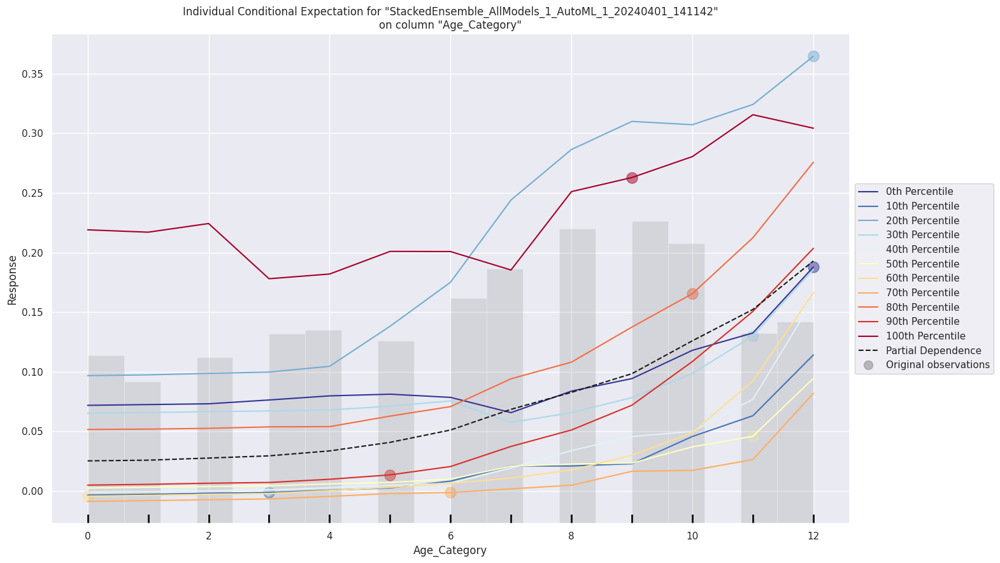

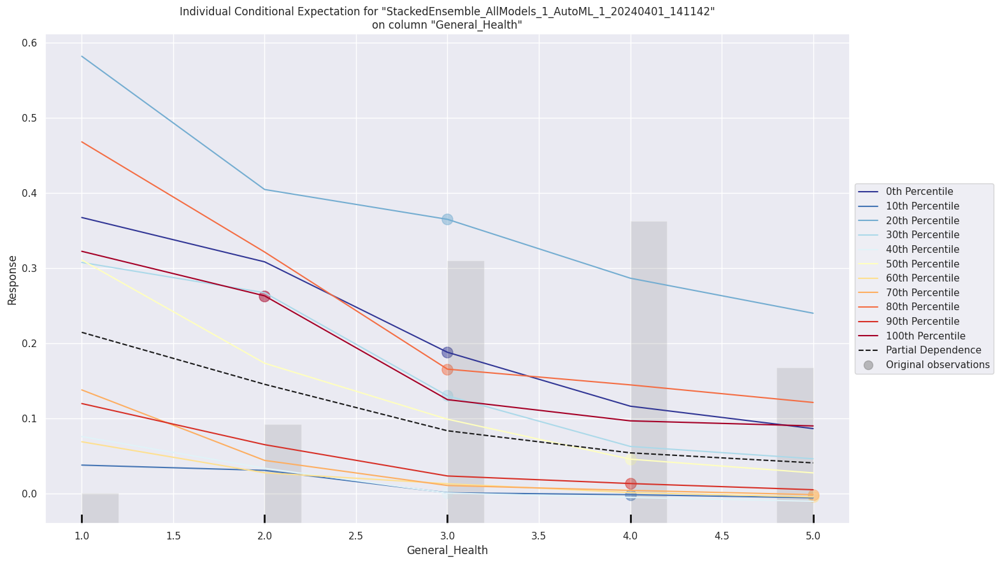

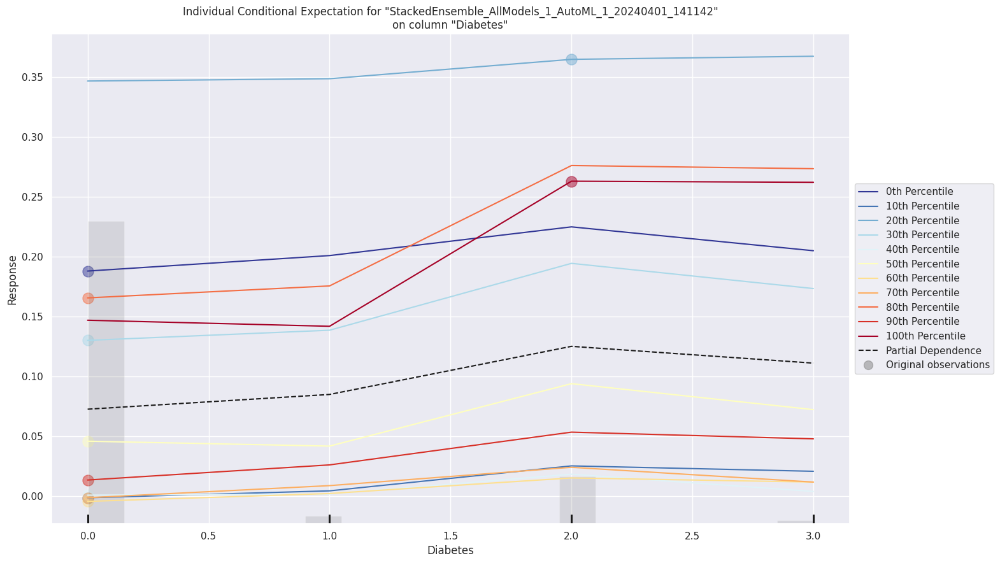

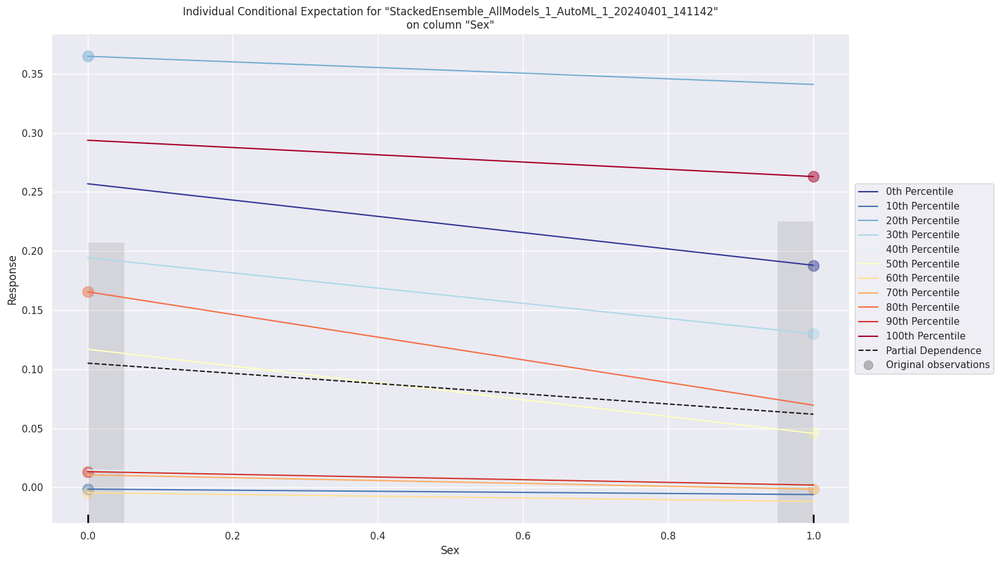

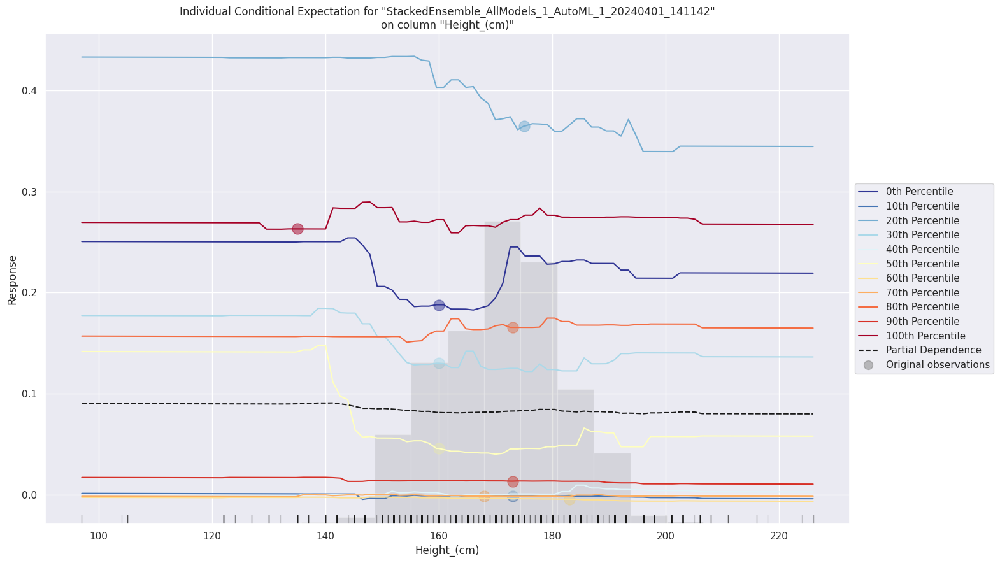

In [102]:
exa = aml.explain(df_test)

1. What is the Report?

The report addressed is how to effectively predict cardiovascular disease risk using data science techniques. Specifically, the aim is to develop a predictive model that can accurately identify individuals at risk of cardiovascular disease based on various demographic, lifestyle, and medical factors.

2. What did you do?

To address the question, the following steps were undertaken:
- Data Cleaning: The dataset was cleaned to handle missing values, outliers, and data transformations.
- Feature Selection: Various techniques such as extra treess classifier and random forest were employed to select the most relevant features for predicting cardiovascular disease risk.
- Modeling:logistic regression, AutoML etc were evaluated and trained to develop predictive models for cardiovascular disease risk prediction.
- Interpretability: Interpretability techniques were used to explain the impact of each feature on the model's predictions and understand the underlying relationships in the data.

3. How well did it work?

The analysis resulted in the development of predictive models that showed promising performance in identifying individuals at risk of cardiovascular disease. The accuracy, precision, recall, and F1-score metrics were used to evaluate model performance, and the models exhibited satisfactory performance levels.

4. What did you learn?

Through this analysis, several key insights were gained:
- The importance of data cleaning in preparing the dataset for modeling.
The significance of feature selection in identifying the most relevant predictors of cardiovascular disease risk.
- The effectiveness of various machine learning algorithms in developing predictive models.
- The importance of model interpretability in understanding the factors influencing cardiovascular disease risk and gaining insights into the underlying relationships in the data.


# Conclusion

In conclusion, our combined analysis of heart disease prediction models and feature importance revealed valuable insights into the factors influencing heart disease risk. Our exploration of various models, including logistic regression, tree-based models, and AutoML, underscored the significance of certain features in predicting heart disease.

From logistic regression, "Smoking History" emerged as the most impactful feature, indicating a strong association with increased heart disease risk, while "Fruit Consumption" had minimal influence. Tree-based models emphasized the importance of "age category" in predicting heart disease, with "checkup" frequency showing less influence.

Leveraging AutoML, we identified Gradient Boosting Machine (GBM) as the most effective model, with "age" being the most influential predictor. These findings highlight the critical role of age and smoking history in heart disease prediction, facilitating improved risk assessment and preventive measures.

Overall, our approach not only streamlined model selection but also enhanced our understanding of key predictors, contributing to more accurate heart disease risk prediction. The integration of data cleaning, model interpretability, and feature importance allowed us to develop robust predictive models while gaining valuable insights into the underlying factors driving heart disease risk.




# **REFERENCES:**
https://github.com/hyunjoonbok/Python-Projects/blob/master/H2O/Complete%20guide%20to%20Machine%20Learning%20with%20H2O%20(AutoML).ipynb

https://github.com/ajhalthor/model-interpretability/blob/main/Shap%20Values.ipynb

https://shap-lrjball.readthedocs.io/en/latest/generated/shap.Explainer.html

https://www.kdnuggets.com/2022/04/logistic-regression-classification.html

https://docs.h2o.ai/h2o/latest-stable/h2o-docs/grid-search.html

W3 schools

H2o autoML - https://docs.h2o.ai/h2o/latest-stable/h2o-docs/automl.html